# Лабораторная работа 2. Передача нейронного стиля

**Цель:** Изучить передачу стиля с использованием свёрточных нейронных сетей.

## Теоретическое введение

**Neural Style Transfer (NST)** — это техника глубокого обучения, которая позволяет взять стиль одного изображения (например, картины художника) и применить его к другому изображению (контенту), сохраняя при этом содержание оригинала.

### Основные принципы:

1. **Контентное представление** — глубокие слои CNN захватывают высокоуровневые особенности изображения
2. **Стилевое представление** — использует корреляции между признаками разных каналов (матрица Грама)
3. **Оптимизация** — минимизация комбинированной функции потерь контента и стиля

### Архитектура

Мы будем использовать предобученную сеть **VGG19**.

## Часть 1. Подготовка окружения

In [4]:
import torch
import torch.nn as nn
import torch.optim as optim
import torchvision.transforms as transforms
import torchvision.models as models
from PIL import Image
import matplotlib.pyplot as plt
import numpy as np
import requests
from io import BytesIO
import os
import warnings
warnings.filterwarnings('ignore')

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print(f"Используемое устройство: {device}")
torch.manual_seed(42)

Используемое устройство: cuda


## Часть 2. Функции для работы с изображениями

In [ ]:
# Размер изображения: 512px при наличии GPU, иначе 256px (для экономии памяти)
IMG_SIZE = 512 if torch.cuda.is_available() else 256

# Конвейер трансформаций для предобработки изображений:
# 1. Resize - приводим все изображения к одинаковому размеру
# 2. ToTensor - конвертируем PIL Image в PyTorch тензор (значения 0-1)
loader = transforms.Compose([
    transforms.Resize((IMG_SIZE, IMG_SIZE)),
    transforms.ToTensor()
])

def load_image(image_path_or_url, max_size=IMG_SIZE):
    """
    Загружает изображение из локального файла или по URL.
    
    Args:
        image_path_or_url: путь к файлу или URL изображения
        max_size: максимальный размер изображения
    
    Returns:
        Тензор изображения размером [1, 3, H, W] на нужном устройстве
    """
    # Проверяем, является ли путь URL-адресом
    if image_path_or_url.startswith('http'):
        # Загружаем изображение из интернета
        # Добавляем User-Agent, т.к. некоторые сайты (Wikipedia) блокируют запросы без него
        headers = {'User-Agent': 'Mozilla/5.0 (Windows NT 10.0; Win64; x64) AppleWebKit/537.36'}
        response = requests.get(image_path_or_url, headers=headers)
        image = Image.open(BytesIO(response.content))
    else:
        # Загружаем локальный файл
        image = Image.open(image_path_or_url)
    
    # Конвертируем в RGB (на случай RGBA или grayscale изображений)
    if image.mode != 'RGB':
        image = image.convert('RGB')
    
    # Применяем трансформации и добавляем batch измерение [1, C, H, W]
    image = loader(image).unsqueeze(0)
    
    # Переносим на GPU/CPU и конвертируем в float32
    return image.to(device, torch.float)

def tensor_to_image(tensor):
    """
    Преобразует PyTorch тензор обратно в numpy массив для отображения.
    
    Args:
        tensor: тензор изображения [1, 3, H, W] или [3, H, W]
    
    Returns:
        numpy массив [H, W, 3] со значениями в диапазоне [0, 1]
    """
    # Копируем тензор и отсоединяем от графа вычислений
    image = tensor.cpu().clone().detach()
    
    # Убираем batch измерение: [1, 3, H, W] -> [3, H, W]
    image = image.squeeze(0)
    
    # Меняем порядок осей: [C, H, W] -> [H, W, C] для matplotlib
    image = image.numpy().transpose(1, 2, 0)
    
    # Обрезаем значения до [0, 1] (могут выйти за границы при оптимизации)
    image = image.clip(0, 1)
    
    return image

def show_images(images, titles, figsize=(15, 5)):
    """
    Отображает несколько изображений в ряд.
    
    Args:
        images: список изображений (тензоры или numpy массивы)
        titles: список заголовков для каждого изображения
        figsize: размер фигуры matplotlib
    """
    # Создаём фигуру с подграфиками
    fig, axes = plt.subplots(1, len(images), figsize=figsize)
    
    # Если одно изображение, axes не является списком - исправляем
    if len(images) == 1:
        axes = [axes]
    
    # Отображаем каждое изображение
    for ax, img, title in zip(axes, images, titles):
        # Конвертируем тензор в numpy если нужно
        if isinstance(img, torch.Tensor):
            img = tensor_to_image(img)
        ax.imshow(img)
        ax.set_title(title, fontsize=12)
        ax.axis('off')  # Скрываем оси
    
    plt.tight_layout()
    plt.show()

## Задание 1: Загрузка изображений контента и стиля

Загрузка изображений...
Размер контентного изображения: torch.Size([1, 3, 512, 512])
Размер стилевого изображения: torch.Size([1, 3, 512, 512])


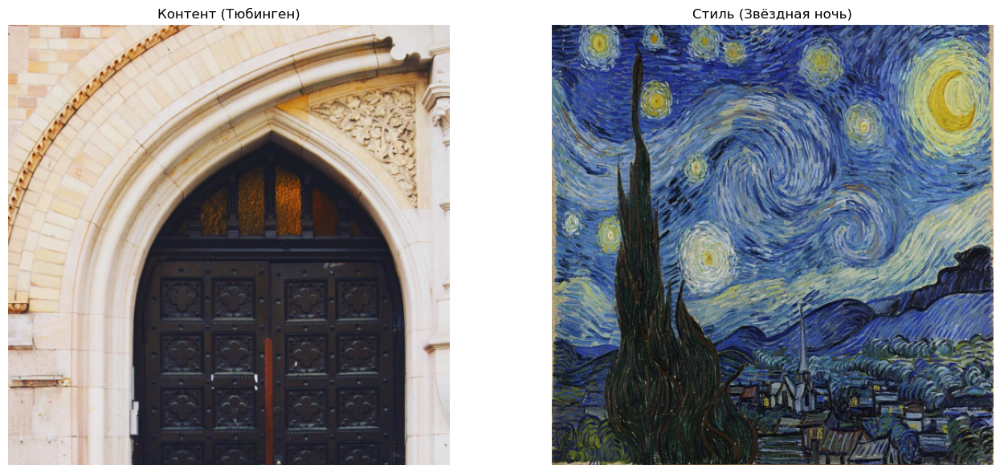

In [11]:
# ============================================================================
# ЗАГРУЗКА ИЗОБРАЖЕНИЙ ДЛЯ ПЕРЕДАЧИ СТИЛЯ
# ============================================================================
# Используем локальные файлы 

# Контентное изображение - фото (из примеров PyTorch)
content_path = "images/content.jpg"

# Стилевое изображение - "Звёздная ночь" Винсента Ван Гога
style_path = "images/style.jpg"

print("Загрузка изображений...")
content_image = load_image(content_path)
style_image = load_image(style_path)

print(f"Размер контентного изображения: {content_image.shape}")
print(f"Размер стилевого изображения: {style_image.shape}")

show_images(
    [content_image, style_image],
    ['Контент (Тюбинген)', 'Стиль (Звёздная ночь)'],
    figsize=(14, 6)
)

## Часть 3. Модель VGG19 для извлечения признаков

In [12]:
vgg = models.vgg19(weights='IMAGENET1K_V1').features.to(device).eval()

for param in vgg.parameters():
    param.requires_grad_(False)

print("Архитектура VGG19 (feature extractor):")
print(vgg)

Downloading: "https://download.pytorch.org/models/vgg19-dcbb9e9d.pth" to /home/roman/.cache/torch/hub/checkpoints/vgg19-dcbb9e9d.pth


100%|██████████| 548M/548M [00:16<00:00, 34.4MB/s] 


Архитектура VGG19 (feature extractor):
Sequential(
  (0): Conv2d(3, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (1): ReLU(inplace=True)
  (2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (3): ReLU(inplace=True)
  (4): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
  (5): Conv2d(64, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (6): ReLU(inplace=True)
  (7): Conv2d(128, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (8): ReLU(inplace=True)
  (9): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
  (10): Conv2d(128, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (11): ReLU(inplace=True)
  (12): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (13): ReLU(inplace=True)
  (14): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (15): ReLU(inplace=True)
  (16): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  

In [14]:
content_layers_default = ['conv4_2']
style_layers_default = ['conv1_1', 'conv2_1', 'conv3_1', 'conv4_1', 'conv5_1']

def get_features(image, model, layers):
    features = {}
    x = image
    
    layer_mapping = {
        '0': 'conv1_1', '2': 'conv1_2',
        '5': 'conv2_1', '7': 'conv2_2',
        '10': 'conv3_1', '12': 'conv3_2', '14': 'conv3_3', '16': 'conv3_4',
        '19': 'conv4_1', '21': 'conv4_2', '23': 'conv4_3', '25': 'conv4_4',
        '28': 'conv5_1', '30': 'conv5_2', '32': 'conv5_3', '34': 'conv5_4'
    }
    
    for name, layer in model._modules.items():
        x = layer(x)
        if name in layer_mapping:
            layer_name = layer_mapping[name]
            if layer_name in layers:
                features[layer_name] = x
    
    return features

## Часть 4. Функции потерь

In [15]:
def gram_matrix(tensor):
    """Вычисление матрицы Грама для представления стиля."""
    batch, channels, height, width = tensor.size()
    features = tensor.view(batch * channels, height * width)
    gram = torch.mm(features, features.t())
    gram = gram.div(batch * channels * height * width)
    return gram

def content_loss(target_features, content_features):
    """Функция потерь контента - MSE между признаками"""
    return torch.mean((target_features - content_features) ** 2)

def style_loss(target_features, style_gram):
    """Функция потерь стиля - MSE между матрицами Грама"""
    target_gram = gram_matrix(target_features)
    return torch.mean((target_gram - style_gram) ** 2)

## Часть 5. Основной алгоритм передачи стиля

In [16]:
def neural_style_transfer(
    content_img,
    style_img,
    num_steps=300,
    style_weight=1e6,
    content_weight=1,
    content_layers=None,
    style_layers=None,
    style_layer_weights=None,
    show_progress=True,
    progress_interval=50
):
    if content_layers is None:
        content_layers = content_layers_default
    if style_layers is None:
        style_layers = style_layers_default
    if style_layer_weights is None:
        style_layer_weights = {layer: 1.0 / len(style_layers) for layer in style_layers}
    
    all_layers = content_layers + style_layers
    content_features = get_features(content_img, vgg, all_layers)
    style_features = get_features(style_img, vgg, all_layers)
    
    style_grams = {layer: gram_matrix(style_features[layer]) for layer in style_layers}
    
    target = content_img.clone().requires_grad_(True).to(device)
    optimizer = optim.LBFGS([target])
    
    history = {'total': [], 'content': [], 'style': []}
    intermediate_images = []
    
    run = [0]
    while run[0] <= num_steps:
        
        def closure():
            with torch.no_grad():
                target.clamp_(0, 1)
            
            optimizer.zero_grad()
            target_features = get_features(target, vgg, all_layers)
            
            c_loss = 0
            for layer in content_layers:
                c_loss += content_loss(target_features[layer], content_features[layer])
            
            s_loss = 0
            for layer in style_layers:
                s_loss += style_layer_weights[layer] * style_loss(
                    target_features[layer], style_grams[layer]
                )
            
            total_loss = content_weight * c_loss + style_weight * s_loss
            total_loss.backward()
            
            if run[0] % 10 == 0:
                history['total'].append(total_loss.item())
                history['content'].append(c_loss.item())
                history['style'].append(s_loss.item())
            
            if show_progress and run[0] % progress_interval == 0:
                print(f"Шаг {run[0]:4d} | Total: {total_loss.item():.2f} | Content: {c_loss.item():.4f} | Style: {s_loss.item():.4f}")
                intermediate_images.append(target.clone().detach())
            
            run[0] += 1
            return total_loss
        
        optimizer.step(closure)
    
    with torch.no_grad():
        target.clamp_(0, 1)
    
    return target, history, intermediate_images

## Часть 6. Применение алгоритма

In [17]:
print("="*60)
print("ЗАПУСК ПЕРЕДАЧИ НЕЙРОННОГО СТИЛЯ")
print("="*60)
print(f"Размер изображения: {IMG_SIZE}x{IMG_SIZE}")
print(f"Устройство: {device}")
print("="*60 + "\n")

output_image, history, intermediate = neural_style_transfer(
    content_image,
    style_image,
    num_steps=300,
    style_weight=1e6,
    content_weight=1,
    progress_interval=50
)

print("\n" + "="*60)
print("ПЕРЕДАЧА СТИЛЯ ЗАВЕРШЕНА!")
print("="*60)

ЗАПУСК ПЕРЕДАЧИ НЕЙРОННОГО СТИЛЯ
Размер изображения: 512x512
Устройство: cuda

Шаг    0 | Total: 1.90 | Content: 0.0000 | Style: 0.0000
Шаг   50 | Total: 0.55 | Content: 0.2278 | Style: 0.0000
Шаг  100 | Total: 0.50 | Content: 0.2100 | Style: 0.0000
Шаг  150 | Total: 0.48 | Content: 0.2040 | Style: 0.0000
Шаг  200 | Total: 0.47 | Content: 0.2005 | Style: 0.0000
Шаг  250 | Total: 0.46 | Content: 0.1981 | Style: 0.0000
Шаг  300 | Total: 0.45 | Content: 0.1963 | Style: 0.0000

ПЕРЕДАЧА СТИЛЯ ЗАВЕРШЕНА!


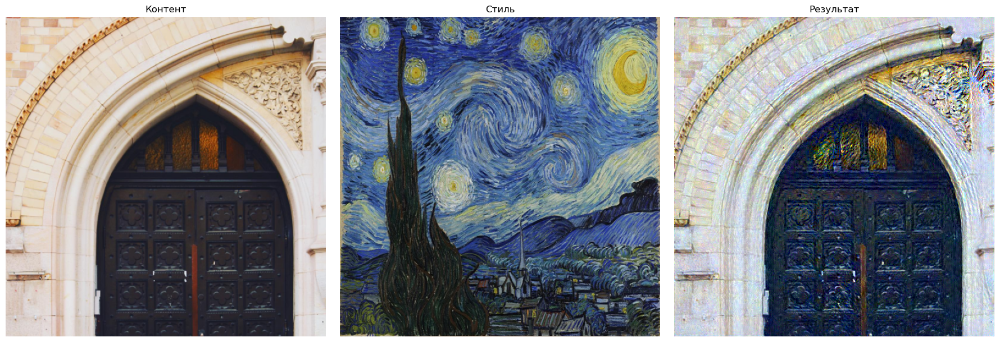

In [18]:
show_images(
    [content_image, style_image, output_image],
    ['Контент', 'Стиль', 'Результат'],
    figsize=(18, 6)
)

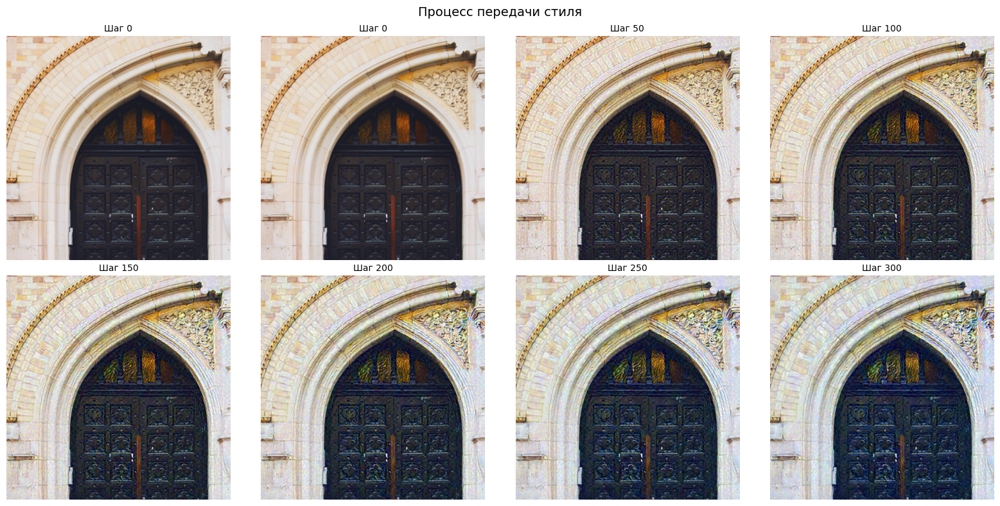

In [19]:
# Визуализация процесса оптимизации
if len(intermediate) >= 4:
    fig, axes = plt.subplots(2, 4, figsize=(16, 8))
    steps = np.linspace(0, len(intermediate)-1, 8, dtype=int)
    
    for idx, ax in enumerate(axes.flat):
        img_idx = steps[idx]
        ax.imshow(tensor_to_image(intermediate[img_idx]))
        ax.set_title(f'Шаг {img_idx * 50}', fontsize=10)
        ax.axis('off')
    
    plt.suptitle('Процесс передачи стиля', fontsize=14)
    plt.tight_layout()
    plt.show()

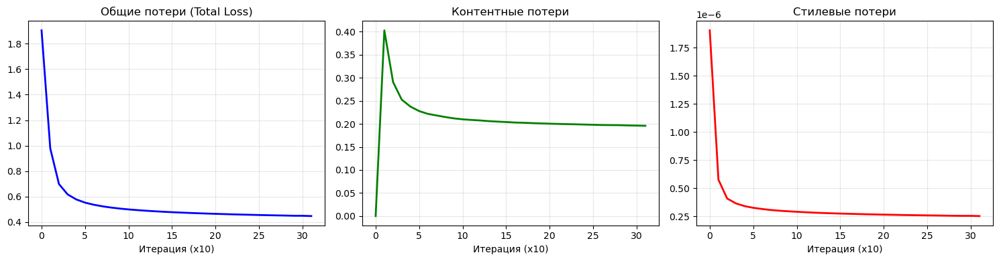

In [20]:
# График потерь
fig, axes = plt.subplots(1, 3, figsize=(15, 4))

axes[0].plot(history['total'], 'b-', linewidth=2)
axes[0].set_title('Общие потери (Total Loss)')
axes[0].set_xlabel('Итерация (x10)')
axes[0].grid(True, alpha=0.3)

axes[1].plot(history['content'], 'g-', linewidth=2)
axes[1].set_title('Контентные потери')
axes[1].set_xlabel('Итерация (x10)')
axes[1].grid(True, alpha=0.3)

axes[2].plot(history['style'], 'r-', linewidth=2)
axes[2].set_title('Стилевые потери')
axes[2].set_xlabel('Итерация (x10)')
axes[2].grid(True, alpha=0.3)

plt.tight_layout()
plt.show()

---
## Задание 2: Эксперименты с различными весами

Соотношение весов `style_weight` и `content_weight` критически влияет на результат:
- **Высокий style_weight**: больше стилизации
- **Высокий content_weight**: сохранение деталей контента

In [21]:
weight_experiments = [
    {'style_weight': 1e4, 'content_weight': 1, 'name': 'Слабый стиль (1e4)'},
    {'style_weight': 1e5, 'content_weight': 1, 'name': 'Умеренный стиль (1e5)'},
    {'style_weight': 1e6, 'content_weight': 1, 'name': 'Стандартный (1e6)'},
    {'style_weight': 1e7, 'content_weight': 1, 'name': 'Сильный стиль (1e7)'},
]

results_weights = []

for exp in weight_experiments:
    print(f"\n{'='*50}")
    print(f"Эксперимент: {exp['name']}")
    print('='*50)
    
    result, _, _ = neural_style_transfer(
        content_image,
        style_image,
        num_steps=200,
        style_weight=exp['style_weight'],
        content_weight=exp['content_weight'],
        show_progress=True,
        progress_interval=100
    )
    results_weights.append((exp['name'], result))


Эксперимент: Слабый стиль (1e4)
Шаг    0 | Total: 0.02 | Content: 0.0000 | Style: 0.0000
Шаг  100 | Total: 0.02 | Content: 0.0009 | Style: 0.0000
Шаг  200 | Total: 0.02 | Content: 0.0014 | Style: 0.0000

Эксперимент: Умеренный стиль (1e5)
Шаг    0 | Total: 0.19 | Content: 0.0000 | Style: 0.0000
Шаг  100 | Total: 0.10 | Content: 0.0174 | Style: 0.0000
Шаг  200 | Total: 0.09 | Content: 0.0132 | Style: 0.0000

Эксперимент: Стандартный (1e6)
Шаг    0 | Total: 1.90 | Content: 0.0000 | Style: 0.0000
Шаг  100 | Total: 0.50 | Content: 0.2104 | Style: 0.0000
Шаг  200 | Total: 0.47 | Content: 0.2006 | Style: 0.0000

Эксперимент: Сильный стиль (1e7)
Шаг    0 | Total: 19.04 | Content: 0.0000 | Style: 0.0000
Шаг  100 | Total: 1.34 | Content: 0.8874 | Style: 0.0000
Шаг  200 | Total: 1.19 | Content: 0.8169 | Style: 0.0000


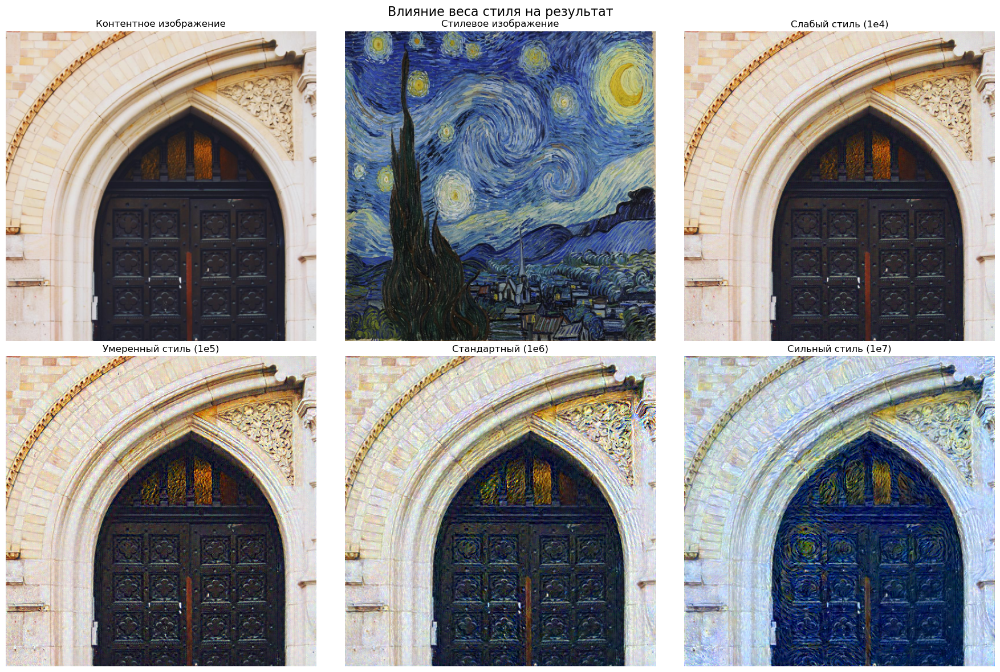

In [22]:
# Визуализация результатов
fig, axes = plt.subplots(2, 3, figsize=(18, 12))

axes[0, 0].imshow(tensor_to_image(content_image))
axes[0, 0].set_title('Контентное изображение', fontsize=12)
axes[0, 0].axis('off')

axes[0, 1].imshow(tensor_to_image(style_image))
axes[0, 1].set_title('Стилевое изображение', fontsize=12)
axes[0, 1].axis('off')

plot_positions = [(0, 2), (1, 0), (1, 1), (1, 2)]
for (name, result), (row, col) in zip(results_weights, plot_positions):
    axes[row, col].imshow(tensor_to_image(result))
    axes[row, col].set_title(name, fontsize=12)
    axes[row, col].axis('off')

plt.suptitle('Влияние веса стиля на результат', fontsize=16)
plt.tight_layout()
plt.show()

### Анализ влияния весов

**Наблюдения:**

1. **Слабый стиль (1e4)**: Результат близок к оригинальному контенту с минимальными изменениями
2. **Умеренный стиль (1e5)**: Баланс между сохранением контента и применением стиля
3. **Стандартный (1e6)**: Хорошая передача стиля при сохранении узнаваемости контента
4. **Сильный стиль (1e7)**: Доминирует стиль, детали контента могут размываться

---
## Задание 3: Анализ влияния различных слоёв сети

Разные слои VGG19 захватывают разные уровни абстракции:
- **Ранние слои (conv1, conv2)**: низкоуровневые признаки (цвета, текстуры, края)
- **Средние слои (conv3, conv4)**: среднеуровневые паттерны (формы, части объектов)
- **Глубокие слои (conv5)**: высокоуровневая семантика (объекты, сцены)

In [23]:
# Эксперимент 1: Только ранние слои
print("\n" + "="*60)
print("Эксперимент: Только ранние слои (conv1_1, conv2_1)")
print("="*60)

result_early, _, _ = neural_style_transfer(
    content_image,
    style_image,
    num_steps=200,
    style_weight=1e6,
    content_weight=1,
    style_layers=['conv1_1', 'conv2_1'],
    show_progress=True,
    progress_interval=100
)


Эксперимент: Только ранние слои (conv1_1, conv2_1)
Шаг    0 | Total: 0.82 | Content: 0.0000 | Style: 0.0000
Шаг  100 | Total: 0.04 | Content: 0.0100 | Style: 0.0000
Шаг  200 | Total: 0.01 | Content: 0.0065 | Style: 0.0000


In [24]:
# Эксперимент 2: Только глубокие слои
print("\n" + "="*60)
print("Эксперимент: Только глубокие слои (conv4_1, conv5_1)")
print("="*60)

result_deep, _, _ = neural_style_transfer(
    content_image,
    style_image,
    num_steps=200,
    style_weight=1e6,
    content_weight=1,
    style_layers=['conv4_1', 'conv5_1'],
    show_progress=True,
    progress_interval=100
)


Эксперимент: Только глубокие слои (conv4_1, conv5_1)
Шаг    0 | Total: 1.94 | Content: 0.0000 | Style: 0.0000
Шаг  100 | Total: 0.69 | Content: 0.3928 | Style: 0.0000
Шаг  200 | Total: 4.29 | Content: 2.5985 | Style: 0.0000


In [25]:
# Эксперимент 3: Все слои с разными весами
print("\n" + "="*60)
print("Эксперимент: Все слои с акцентом на средние")
print("="*60)

custom_weights = {
    'conv1_1': 0.1,
    'conv2_1': 0.2,
    'conv3_1': 0.4,
    'conv4_1': 0.2,
    'conv5_1': 0.1
}

result_custom, _, _ = neural_style_transfer(
    content_image,
    style_image,
    num_steps=200,
    style_weight=1e6,
    content_weight=1,
    style_layer_weights=custom_weights,
    show_progress=True,
    progress_interval=100
)


Эксперимент: Все слои с акцентом на средние
Шаг    0 | Total: 2.66 | Content: 0.0000 | Style: 0.0000
Шаг  100 | Total: 0.48 | Content: 0.2090 | Style: 0.0000
Шаг  200 | Total: 0.44 | Content: 0.1978 | Style: 0.0000


In [26]:
# Эксперимент 4: Ранний слой для контента
print("\n" + "="*60)
print("Эксперимент: Ранний слой для контента (conv2_2)")
print("="*60)

result_content_early, _, _ = neural_style_transfer(
    content_image,
    style_image,
    num_steps=200,
    style_weight=1e6,
    content_weight=1,
    content_layers=['conv2_2'],
    show_progress=True,
    progress_interval=100
)


Эксперимент: Ранний слой для контента (conv2_2)
Шаг    0 | Total: 1.90 | Content: 0.0000 | Style: 0.0000
Шаг  100 | Total: 0.29 | Content: 0.2122 | Style: 0.0000
Шаг  200 | Total: 0.27 | Content: 0.2061 | Style: 0.0000


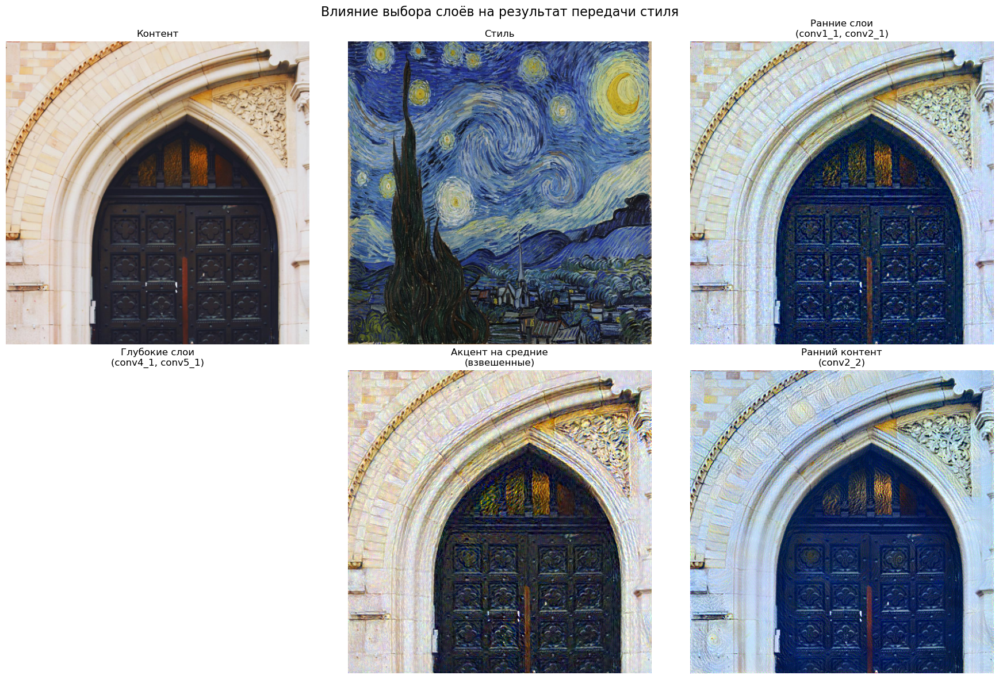

In [27]:
# Визуализация результатов экспериментов со слоями
fig, axes = plt.subplots(2, 3, figsize=(18, 12))

layer_results = [
    (content_image, 'Контент'),
    (style_image, 'Стиль'),
    (result_early, 'Ранние слои\n(conv1_1, conv2_1)'),
    (result_deep, 'Глубокие слои\n(conv4_1, conv5_1)'),
    (result_custom, 'Акцент на средние\n(взвешенные)'),
    (result_content_early, 'Ранний контент\n(conv2_2)')
]

for ax, (img, title) in zip(axes.flat, layer_results):
    ax.imshow(tensor_to_image(img))
    ax.set_title(title, fontsize=12)
    ax.axis('off')

plt.suptitle('Влияние выбора слоёв на результат передачи стиля', fontsize=16)
plt.tight_layout()
plt.show()

### Анализ влияния слоёв

**Наблюдения:**

1. **Ранние слои (conv1_1, conv2_1):**
   - Захватывают мелкие текстуры и цветовые паттерны
   - Хорошо передают цветовую гамму стиля

2. **Глубокие слои (conv4_1, conv5_1):**
   - Захватывают крупномасштабные паттерны
   - Более абстрактная стилизация
   - Лучше сохраняют структуру контента

3. **Взвешенная комбинация:**
   - Баланс между мелкими и крупными паттернами
   - Наиболее гармоничный результат

4. **Выбор слоя для контента:**
   - Ранний слой: сохраняются мелкие детали
   - Глубокий слой: сохраняется общая структура

---
## Дополнительные эксперименты: Другие стили

In [ ]:
# Загрузка дополнительных стилевых изображений

# "Великая волна в Канагаве" - Кацусика Хокусай (1831)
# Используем локальный файл
wave_path = "images/wave.jpg"

print("Загрузка дополнительного стиля...")
try:
    style_wave = load_image(wave_path)
    show_images([style_wave], ['Великая волна (Хокусай)'], figsize=(8, 6))
except Exception as e:
    print(f"Ошибка загрузки: {e}")
    style_wave = None

Загрузка дополнительного стиля...
Ошибка загрузки: cannot identify image file <_io.BytesIO object at 0x74ecdb7d3e20>


In [ ]:
if style_wave is not None:
    print("\n" + "="*60)
    print("Применение стиля: Великая волна (Хокусай)")
    print("="*60)
    
    result_wave, _, _ = neural_style_transfer(
        content_image,
        style_wave,
        num_steps=200,
        style_weight=1e6,
        content_weight=1,
        show_progress=True,
        progress_interval=100
    )
    
    show_images(
        [content_image, style_wave, result_wave],
        ['Контент', 'Стиль: Великая волна', 'Результат'],
        figsize=(18, 6)
    )

---
## Сохранение результатов

In [ ]:
output_dir = 'results'
os.makedirs(output_dir, exist_ok=True)

def save_result(tensor, filename):
    img = tensor_to_image(tensor)
    img = (img * 255).astype(np.uint8)
    Image.fromarray(img).save(os.path.join(output_dir, filename))
    print(f"Сохранено: {os.path.join(output_dir, filename)}")

save_result(output_image, 'main_result_starry_night.jpg')

for name, result in results_weights:
    filename = f"weight_{name.split()[0]}_{name.split('(')[1].replace(')', '')}.jpg"
    save_result(result, filename)

save_result(result_early, 'layers_early.jpg')
save_result(result_deep, 'layers_deep.jpg')
save_result(result_custom, 'layers_custom_weights.jpg')
save_result(result_content_early, 'layers_content_early.jpg')

if style_wave is not None:
    save_result(result_wave, 'style_wave.jpg')

print(f"\nВсе результаты сохранены в папку: {output_dir}/")

---
## Выводы

В данной лабораторной работе мы изучили алгоритм передачи нейронного стиля (Neural Style Transfer):

### 1. Реализация базового алгоритма
- Использована предобученная сеть VGG19 для извлечения признаков
- Реализованы функции потерь для контента (MSE) и стиля (матрица Грама)
- Применён оптимизатор L-BFGS для минимизации комбинированной функции потерь

### 2. Влияние весов стиля и контента
- **Низкий style_weight (1e4)**: минимальная стилизация
- **Высокий style_weight (1e7)**: сильная стилизация, возможная потеря деталей
- **Оптимальное соотношение**: обычно 1e5-1e6

### 3. Влияние выбора слоёв
- **Ранние слои**: захватывают мелкие текстуры и цвета
- **Глубокие слои**: захватывают крупномасштабные паттерны и семантику
- **Комбинация слоёв**: даёт наиболее гармоничный результат

### Практические рекомендации:
1. Начинать с стандартных параметров (style_weight=1e6, все 5 слоёв для стиля)
2. Увеличивать style_weight для более выраженной стилизации
3. Использовать ранние слои для передачи текстуры, глубокие — для структуры
4. Экспериментировать с количеством итераций (200-500 обычно достаточно)

In [ ]:
print("\n" + "="*60)
print("ЛАБОРАТОРНАЯ РАБОТА 2 ЗАВЕРШЕНА!")
print("="*60)
print(f"\nРезультаты сохранены в папку: {os.path.abspath(output_dir)}")
print("\nСписок сохранённых файлов:")
for f in os.listdir(output_dir):
    print(f"  - {f}")